# Age and Gender Classification Project

For this project, we are going to perform gender and age classification from
up-close images of people. We will make one single model that does both of
these tasks. Then, we will analyse the model from an ethical point of view
and describe what sort of dangers and caveats such models can have. The
dataset used can be found here: https://www.kaggle.com/datasets/jangedoo/utkface-new

## Imports

In [2]:
import os
import time
from pathlib import Path

import cv2
import imagesize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
from sklearn.metrics import accuracy_score, mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import random_split
from transformers import LevitConfig, LevitModel
from transformers import LevitForImageClassification

from helper_methods import add_counts, plot_confusion_matrix, \
    plot_classification_report, explain_gender_with_lime_samples, \
    explain_age_with_lime_samples


## Exploratory Data Analysis

For our EDA, we want to understand what data we are working with. In order to
 do that, we are going to study the images themselves, then feature
 distribution.

### Feature Retrieval

First, let's create a DataFrame with all the relevant features. For each image, we want to know its height, width, and aspect ratio. Furthermore, from each image name, we can retrieve the age, gender, and ethnicity of the person in the picture, so we are going to retrieve those features as well.

In [3]:
filedr = 'utkface_aligned_cropped/UTKFace'

In [4]:
files = os.listdir(filedr)

In [5]:
root = filedr + '/'

imgs = [img for img in Path(root).rglob('*.jpg')]

img_meta = {}
for img in imgs:
    img_meta[img.name] = imagesize.get(img)

img_meta_df = pd.DataFrame.from_dict(img_meta, orient='index',
                                     columns=['Width', 'Height']).reset_index()
img_meta_df.rename(columns={'index': 'FileName'}, inplace=True)
img_meta_df["Aspect Ratio"] = round(
    img_meta_df["Width"] / img_meta_df["Height"], 2)
img_meta_df["Age"] = img_meta_df["FileName"].apply(lambda x: int(x.split('_')
                                                                 [0]))
img_meta_df["Gender"] = img_meta_df["FileName"].apply(lambda x: int(x.split('_')
                                                                    [1]))
img_meta_df["Ethnicity"] = img_meta_df["FileName"].apply(lambda x: int(x.split
                                                                       ('_')[
                                                                           2]))

In [6]:
img_meta_df.head()

,FileName,Width,Height,Aspect Ratio,Age,Gender,Ethnicity
0,100_0_0_20170112213500903.jpg.chip.jpg,200,200,1.0,100,0,0
1,100_0_0_20170112215240346.jpg.chip.jpg,200,200,1.0,100,0,0
2,100_1_0_20170110183726390.jpg.chip.jpg,200,200,1.0,100,1,0
3,100_1_0_20170112213001988.jpg.chip.jpg,200,200,1.0,100,1,0
4,100_1_0_20170112213303693.jpg.chip.jpg,200,200,1.0,100,1,0


Our DataFrame contains six columns:
- FileName: the name of the .jpg file
- Width: its width, measured in pixels
- Height: its height, measured in pixels
- Aspect Ratio: its ratio (width divided by height)
- Age: age of the person in the picture
- Gender: gender of the person in the picture. 0 indicates the person is
male, while 1 means female
- Ethnicity: ethnicity of the person in the picture. 0: White, 1: Black, 2:
 Asian, 3: Indian, 4: Other.

### Data Validation

Before we start exploring our data, we need to know if our data is ready. We
are going to check for duplicates, missing values, and image proportion.

Check for duplicates or missing values.

In [7]:
img_meta_df.duplicated().sum()

0

In [8]:
img_meta_df.isnull().sum()

FileName        0
Width           0
Height          0
Aspect Ratio    0
Age             0
Gender          0
Ethnicity       0
dtype: int64

We have neither duplicates nor missing values.

Check if all images have the same size.

In [9]:
img_meta_df[['Width', 'Height']].value_counts()

Width  Height
200    200       23708
dtype: int64

All images have the same size.

### Visualising samples

In order to get a better understanding of our dataset, we are going to
display some of our samples, as well as their age, gender, and ethnicity.

In [6]:
ethnicity_mapping = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian',
                     4: 'Other'}
gender_mapping = {0: 'Male', 1: 'Female'}

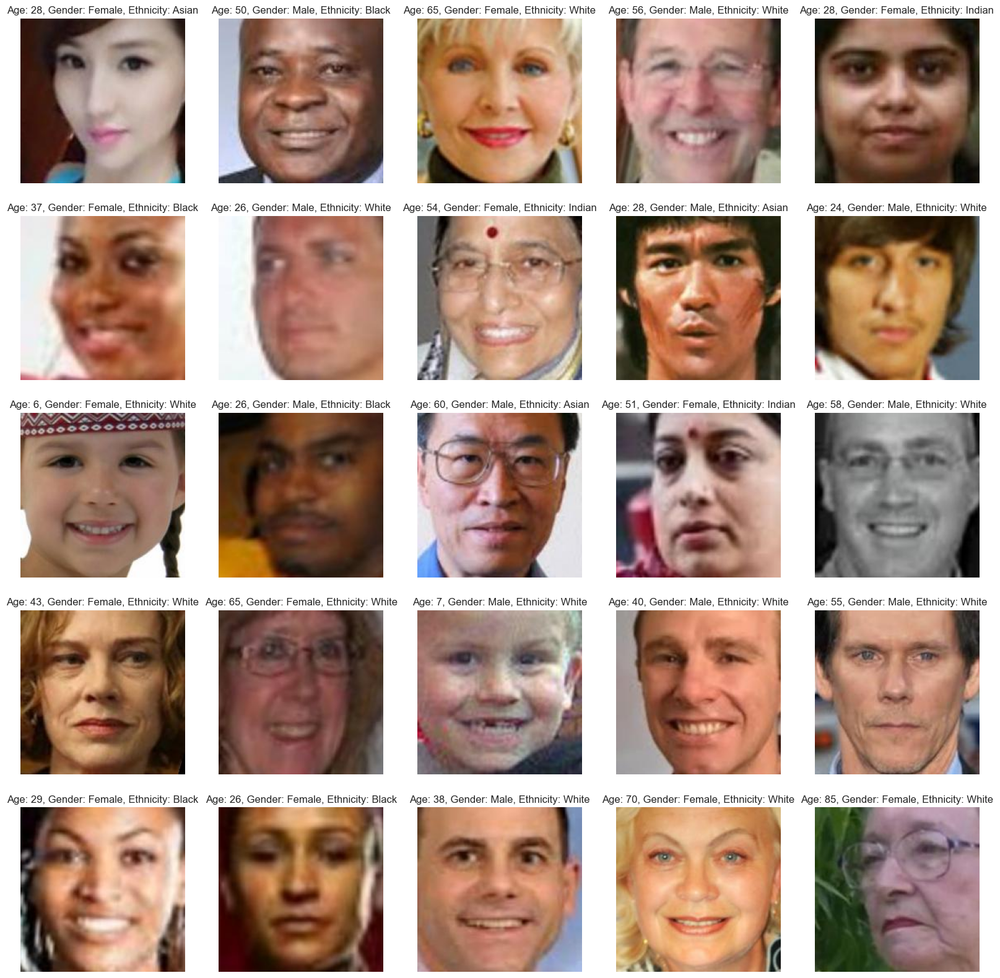

In [23]:
num_samples = 25

plt.figure(figsize=(20, 20))
files = img_meta_df.sample(n=num_samples)

for index, (_, file) in enumerate(files.iterrows()):
    plt.subplot(5, 5, index + 1)
    img = cv2.imread(filedr + file['FileName'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title(f"Age: {file['Age']}, Gender: {gender_mapping[file['Gender']]}, "
              f"Ethnicity: "
              f"{ethnicity_mapping[file['Ethnicity']]}")
    plt.axis('off')

plt.show()


As we can see, all images show a human face. It seems some of them have been
cropped, probably to maintain the same image ratio. As a result, some images
appear to be blurred and pixelated, possibly making identification harder.

### Feature Distribution

Lastly, we would like to know how age, gender, and ethnicity are represented
in our dataset.

First of all, let's use the describe function to get a summary of our features.

In [11]:
img_meta_df.describe()

,Width,Height,Aspect Ratio,Age,Gender,Ethnicity
count,23708.0,23708.0,23708.0,23708.000000,23708.000000,23708.000000
mean,200.0,200.0,1.0,33.303484,0.477349,1.269276
std,0.0,0.0,0.0,19.886112,0.499497,1.345602
min,200.0,200.0,1.0,1.000000,0.000000,0.000000
25%,200.0,200.0,1.0,23.000000,0.000000,0.000000
50%,200.0,200.0,1.0,29.000000,0.000000,1.000000
75%,200.0,200.0,1.0,45.000000,1.000000,2.000000
max,200.0,200.0,1.0,116.000000,1.000000,4.000000


We can see our samples are between 1 and 116 years old, the average being 33. We
 also see 47.73% of our samples are female.

To gain more insights, let's plot those columns, as well as
combinations of them.

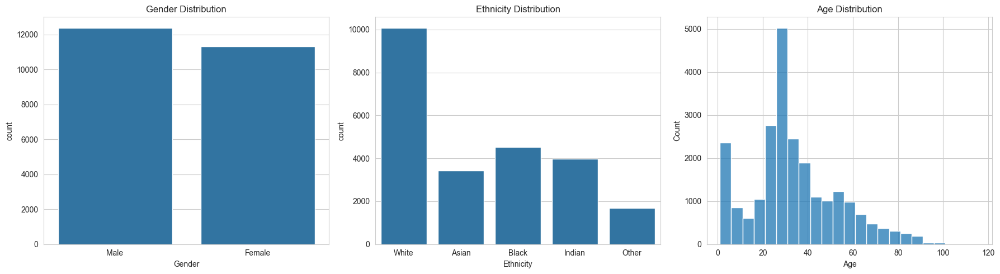

In [139]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.countplot(x=img_meta_df['Gender'].map(gender_mapping), ax=axes[0])
axes[0].set_title('Gender Distribution')

sns.countplot(x=img_meta_df.Ethnicity.map(ethnicity_mapping), ax=axes[1])
axes[1].set_title('Ethnicity Distribution')

sns.histplot(x=img_meta_df.Age, ax=axes[2], binwidth=5)
axes[2].set_title('Age Distribution')

plt.tight_layout()
plt.show()

In [10]:
img_meta_df['Age'].value_counts().head()

26    2197
1     1123
28     918
35     880
24     859
Name: Age, dtype: int64

As we mentioned before, there are slightly more males than females.
As for ethnicity, we see the classes are fairly imbalanced. Almost half of the
people in our dataset are White, with over 10K samples. However, for the rest
 of ethnicities, only Black has more than 4K samples.
When it comes to age, we observe a negatively skewed distribution, except for
two peaks at ages 26 and 1.

Now, let's combine our features.

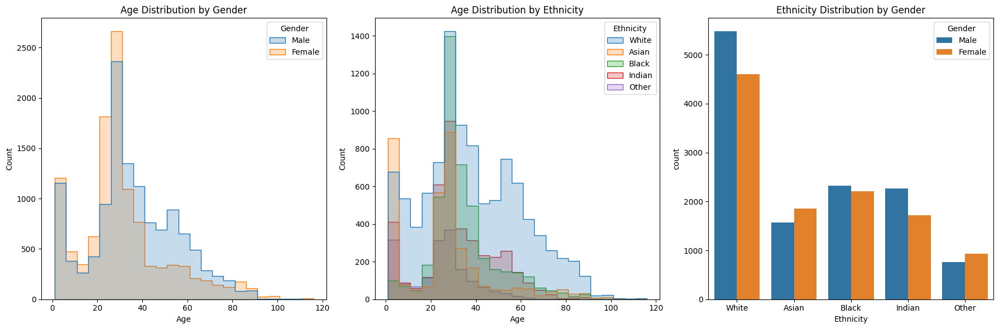

In [52]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.histplot(x=img_meta_df.Age, hue=img_meta_df.Gender.map(gender_mapping),
             element="step",
             binwidth=5, ax=axes[0])
axes[0].set_title('Age Distribution by Gender')

sns.histplot(x=img_meta_df['Age'],
             hue=img_meta_df['Ethnicity'].map(ethnicity_mapping),
             element='step', binwidth=5, palette='tab10', multiple='layer',
             ax=axes[1])
axes[1].set_title('Age Distribution by Ethnicity')

sns.countplot(x=img_meta_df.Ethnicity.map(ethnicity_mapping),
              hue=img_meta_df.Gender.map(gender_mapping),
              ax=axes[2])
axes[2].set_title('Ethnicity Distribution by Gender')

plt.tight_layout()
plt.show()

Interestingly, when it comes to samples under 40 and over 80, there are more
female than male samples. However, from 40 to 80 years old, two thirds of
samples are male.

If we take a look at the age distribution by ethnicity, we notice that ages 1
 and 26, where we previously identified two peaks, are the only ages where
 White is not the majority class, but Asian and Black, respectively. On the
 other hand, we observe that more than half of samples over 40 years old
 are white.

As for the ethnicity distribution by gender, it is worth noting that for
ethnicities Asian and Other there are more females than males.

For this project, we are going to perform gender and age classification from
up-close images of people. We will make one single model that does both of
these tasks. Then, we will analyse the model from an ethical point of view
and describe what sort of dangers and caveats such models can have.

## Modelling

We want our model to return age and gender in a single pass, using an image as input. In order to do that, we are going to use openCV to read the images and return the image itself, its title (for testing purposes), and the age and gender of the person in the picture.

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.image_files = os.listdir(image_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_name)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        age, gender, _, _ = img_name.split('_')
        age = int(age)
        gender = int(gender)

        if self.transform:
            image = self.transform(Image.fromarray(image))

        return image, img_name, {'Age': age, 'Gender': gender}
    def _parse_label(self, idx):
        img_name = self.image_files[idx]
        age, gender, ethnicity, _ = img_name.split('_')
        age = int(age)
        gender = int(gender)
        age_bucket = self._bucketize_age(age)
        return age_bucket, gender, ethnicity
    def _bucketize_age(self, age):
        if age < 10:
            return '0-9'
        elif age < 20:
            return '10-19'
        elif age < 30:
            return '20-29'
        elif age < 40:
            return '30-39'
        elif age < 50:
            return '40-49'
        elif age < 60:
            return '50-59'
        else:
            return '60+'

Now, let's prepare the data for training, validation, and testing. We will define transformations to be applied to the images, split the dataset into training, validation, and test sets, and create data loaders for each of these subsets.

In [68]:
imagenet_stats = ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2,
                           hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(*imagenet_stats)
])

val_test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(*imagenet_stats)
])

image_dir = root

full_dataset = CustomDataset(image_dir=image_dir, transform=None)

labels = [full_dataset._parse_label(idx) for idx in range(len(full_dataset))]

train_indices, temp_indices = train_test_split(
    range(len(full_dataset)), test_size=0.3, stratify=labels, random_state=42)

val_indices, test_indices = train_test_split(
    temp_indices, test_size=0.5, stratify=[labels[i] for i in temp_indices], random_state=42)

train_dataset = torch.utils.data.Subset(full_dataset, train_indices)
val_dataset = torch.utils.data.Subset(full_dataset, val_indices)
test_dataset = torch.utils.data.Subset(full_dataset, test_indices)

train_dataset.dataset.transform = train_transform
val_dataset.dataset.transform = val_test_transform
test_dataset.dataset.transform = val_test_transform

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

Our model, LeViTForAgeGenderPrediction, leverages the LeViT architecture, which is pre-trained on a large image dataset, and fine-tunes it for these specific tasks by adding custom output layers (age_head and gender_head). The dropout layer is added to improve the model's generalization ability and reduce the risk of overfitting.

In [69]:
configuration = LevitConfig()

model = LevitModel(configuration)

configuration = model.config

In [70]:
class LeViTForAgeGenderPrediction(nn.Module):
    def __init__(self, dropout_rate=0.5):
        super(LeViTForAgeGenderPrediction, self).__init__()

        self.levit = LevitForImageClassification.from_pretrained(
            'facebook/levit-128s')
        num_features = self.levit.config.num_labels
        self.dropout = nn.Dropout(p=dropout_rate)

        self.age_head = nn.Linear(num_features, 1)
        self.gender_head = nn.Linear(num_features, 2)

    def forward(self, pixel_values):
        outputs = self.levit(pixel_values=pixel_values)
        logits = outputs.logits

        logits = self.dropout(logits)

        age_logits = self.age_head(logits)
        gender_logits = self.gender_head(logits)

        return age_logits, gender_logits

In [71]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LeViTForAgeGenderPrediction().to(device)

The next step is to train and validate our model. We will use two functions, `train_model` and `validate_model`. `train_model` handles the overall training process, including tracking progress, printing updates, saving the best model, and implementing early stopping. The `validate_model` function handles evaluating the model on the validation set after each epoch to help monitor training progress and adjust based on validation performance. 

Because we are training our model for two tasks, classification and regression, we need two different loss functions. We will use cross entropy for classification, and mean squared error for regression. In order to make sure that we are improving both tasks, we will use dynamic weighting.

In [72]:
def train_model(train_loader, val_loader, model, optimizer, age_loss_fn,
                gender_loss_fn, num_epochs=5, patience=3):
    best_val_loss = float('inf')
    patience_counter = 0

    for epoch in range(num_epochs):
        model.train()
        running_age_loss = 0.0
        running_gender_loss = 0.0
        num_batches = len(train_loader)

        print(f"Starting Epoch {epoch + 1}/{num_epochs}")
        batch_x10_start_time = time.time()
        for batch_idx, (images, img_name, labels) in enumerate(train_loader):
            images = images.to(device)
            age_labels = labels['Age'].to(device).float().unsqueeze(1)
            gender_labels = labels['Gender'].to(device)

            optimizer.zero_grad()
            age_pred, gender_pred = model(images)

            loss_age = age_loss_fn(age_pred, age_labels)
            loss_gender = gender_loss_fn(gender_pred, gender_labels)
            loss = loss_age + loss_gender

            loss.backward()
            optimizer.step()

            running_age_loss += loss_age.item()
            running_gender_loss += loss_gender.item()

            if (batch_idx + 1) % 10 == 0:
                batch_x10_end_time = time.time()
                print(
                    f"Epoch [{epoch + 1}/{num_epochs}], Batch [{batch_idx + 1}/{num_batches}], "
                    f"Batch Age Loss: {loss_age.item():.4f}, Batch Gender Loss: {loss_gender.item():.4f}, "
                    f"Time: {batch_x10_end_time - batch_x10_start_time}")
                batch_x10_start_time = time.time()

        avg_age_loss = running_age_loss / len(train_loader)
        avg_gender_loss = running_gender_loss / len(train_loader)

        print(
            f"End of Epoch {epoch + 1}: Average Age Loss: {avg_age_loss:.4f}, Average Gender Loss: {avg_gender_loss:.4f}")
        print('-' * 50)

        val_loss = validate_model(val_loader, model, age_loss_fn,
                                  gender_loss_fn)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered")
                break


def validate_model(val_loader, model, age_loss_fn, gender_loss_fn):
    model.eval()
    running_age_loss = 0.0
    running_gender_loss = 0.0

    with torch.no_grad():
        for (images, img_names, labels) in val_loader:
            images = images.to(device)
            age_labels = labels['Age'].to(device).float().unsqueeze(1)
            gender_labels = labels['Gender'].to(device)

            age_pred, gender_pred = model(images)

            loss_age = age_loss_fn(age_pred, age_labels)
            loss_gender = gender_loss_fn(gender_pred, gender_labels)

            running_age_loss += loss_age.item()
            running_gender_loss += loss_gender.item()

    avg_age_loss = running_age_loss / len(val_loader)
    avg_gender_loss = running_gender_loss / len(val_loader)

    epsilon = 1e-7
    age_weight = 1.0 / (avg_age_loss + epsilon)
    gender_weight = 1.0 / (avg_gender_loss + epsilon)

    total_weight = age_weight + gender_weight
    age_weight /= total_weight
    gender_weight /= total_weight

    combined_loss = age_weight * avg_age_loss + gender_weight * avg_gender_loss

    print(
        f"Validation: Average Age Loss: {avg_age_loss:.4f}, Average Gender Loss: {avg_gender_loss:.4f}")
    print(
        f"Validation: Age Weight: {age_weight:.4f}, Gender Weight: {gender_weight:.4f}")
    print(f"Validation: Combined Loss: {combined_loss:.4f}")

    return combined_loss

In [73]:
optimizer = optim.AdamW(model.parameters(), lr=0.001)
age_loss_fn = nn.MSELoss()
gender_loss_fn = nn.CrossEntropyLoss()

In [74]:
train_model(train_loader, val_loader, model, optimizer, age_loss_fn,
            gender_loss_fn, num_epochs=7, patience=3)

Starting Epoch 1/7
Epoch [1/7], Batch [10/519], Batch Age Loss: 1072.6099, Batch Gender Loss: 0.7715, Time: 10.948349714279175
Epoch [1/7], Batch [20/519], Batch Age Loss: 1681.9875, Batch Gender Loss: 0.7310, Time: 9.764932870864868
Epoch [1/7], Batch [30/519], Batch Age Loss: 1071.4070, Batch Gender Loss: 0.5983, Time: 8.326096773147583
Epoch [1/7], Batch [40/519], Batch Age Loss: 826.4006, Batch Gender Loss: 0.7792, Time: 8.359044790267944
Epoch [1/7], Batch [50/519], Batch Age Loss: 566.3133, Batch Gender Loss: 0.6841, Time: 6.52569055557251
Epoch [1/7], Batch [60/519], Batch Age Loss: 315.6899, Batch Gender Loss: 0.6352, Time: 6.325261831283569
Epoch [1/7], Batch [70/519], Batch Age Loss: 328.8771, Batch Gender Loss: 0.9745, Time: 8.179755926132202
Epoch [1/7], Batch [80/519], Batch Age Loss: 364.7393, Batch Gender Loss: 0.8307, Time: 6.243897914886475
Epoch [1/7], Batch [90/519], Batch Age Loss: 248.0688, Batch Gender Loss: 0.8737, Time: 5.833737134933472
Epoch [1/7], Batch [100/

Epoch [2/7], Batch [240/519], Batch Age Loss: 158.7258, Batch Gender Loss: 0.8143, Time: 6.062570095062256
Epoch [2/7], Batch [250/519], Batch Age Loss: 135.9882, Batch Gender Loss: 0.8161, Time: 8.23392128944397
Epoch [2/7], Batch [260/519], Batch Age Loss: 187.3600, Batch Gender Loss: 0.5766, Time: 6.579355001449585
Epoch [2/7], Batch [270/519], Batch Age Loss: 109.6043, Batch Gender Loss: 0.6493, Time: 6.091858625411987
Epoch [2/7], Batch [280/519], Batch Age Loss: 73.1385, Batch Gender Loss: 0.6536, Time: 8.469914436340332
Epoch [2/7], Batch [290/519], Batch Age Loss: 238.3042, Batch Gender Loss: 0.9851, Time: 6.415448188781738
Epoch [2/7], Batch [300/519], Batch Age Loss: 194.6366, Batch Gender Loss: 0.7195, Time: 7.115765333175659
Epoch [2/7], Batch [310/519], Batch Age Loss: 125.1738, Batch Gender Loss: 0.6446, Time: 7.888001918792725
Epoch [2/7], Batch [320/519], Batch Age Loss: 127.0494, Batch Gender Loss: 0.4193, Time: 7.894032001495361
Epoch [2/7], Batch [330/519], Batch Age

Epoch [3/7], Batch [480/519], Batch Age Loss: 88.0313, Batch Gender Loss: 0.7642, Time: 5.746410846710205
Epoch [3/7], Batch [490/519], Batch Age Loss: 118.8887, Batch Gender Loss: 0.6646, Time: 7.308513164520264
Epoch [3/7], Batch [500/519], Batch Age Loss: 60.2521, Batch Gender Loss: 0.4858, Time: 5.5899035930633545
Epoch [3/7], Batch [510/519], Batch Age Loss: 63.5485, Batch Gender Loss: 0.5582, Time: 5.901127338409424
End of Epoch 3: Average Age Loss: 115.8172, Average Gender Loss: 0.6741
--------------------------------------------------
Validation: Average Age Loss: 87.5498, Average Gender Loss: 0.4986
Validation: Age Weight: 0.0057, Gender Weight: 0.9943
Validation: Combined Loss: 0.9916
Starting Epoch 4/7
Epoch [4/7], Batch [10/519], Batch Age Loss: 61.8438, Batch Gender Loss: 0.6192, Time: 7.674237489700317
Epoch [4/7], Batch [20/519], Batch Age Loss: 127.1839, Batch Gender Loss: 0.6888, Time: 5.808974266052246
Epoch [4/7], Batch [30/519], Batch Age Loss: 65.8802, Batch Gender

Epoch [5/7], Batch [180/519], Batch Age Loss: 65.9778, Batch Gender Loss: 0.4390, Time: 2.4326229095458984
Epoch [5/7], Batch [190/519], Batch Age Loss: 95.5049, Batch Gender Loss: 0.6390, Time: 2.453747510910034
Epoch [5/7], Batch [200/519], Batch Age Loss: 65.1608, Batch Gender Loss: 0.5835, Time: 2.532461643218994
Epoch [5/7], Batch [210/519], Batch Age Loss: 41.1299, Batch Gender Loss: 0.5545, Time: 2.7140402793884277
Epoch [5/7], Batch [220/519], Batch Age Loss: 48.3950, Batch Gender Loss: 0.5470, Time: 2.4205169677734375
Epoch [5/7], Batch [230/519], Batch Age Loss: 48.8690, Batch Gender Loss: 0.3460, Time: 2.5882537364959717
Epoch [5/7], Batch [240/519], Batch Age Loss: 33.5017, Batch Gender Loss: 0.5445, Time: 2.2986905574798584
Epoch [5/7], Batch [250/519], Batch Age Loss: 88.0501, Batch Gender Loss: 0.5255, Time: 2.240586042404175
Epoch [5/7], Batch [260/519], Batch Age Loss: 50.2237, Batch Gender Loss: 0.4158, Time: 2.2611024379730225
Epoch [5/7], Batch [270/519], Batch Age 

Epoch [6/7], Batch [420/519], Batch Age Loss: 90.5754, Batch Gender Loss: 0.5682, Time: 4.176218032836914
Epoch [6/7], Batch [430/519], Batch Age Loss: 48.4106, Batch Gender Loss: 0.5037, Time: 2.29783034324646
Epoch [6/7], Batch [440/519], Batch Age Loss: 102.6248, Batch Gender Loss: 0.6709, Time: 2.2444229125976562
Epoch [6/7], Batch [450/519], Batch Age Loss: 52.4007, Batch Gender Loss: 0.4781, Time: 2.240543842315674
Epoch [6/7], Batch [460/519], Batch Age Loss: 78.6324, Batch Gender Loss: 0.8720, Time: 2.1288363933563232
Epoch [6/7], Batch [470/519], Batch Age Loss: 98.8102, Batch Gender Loss: 0.5743, Time: 2.070361852645874
Epoch [6/7], Batch [480/519], Batch Age Loss: 65.1022, Batch Gender Loss: 0.5229, Time: 2.2490105628967285
Epoch [6/7], Batch [490/519], Batch Age Loss: 43.9158, Batch Gender Loss: 0.6189, Time: 2.0910162925720215
Epoch [6/7], Batch [500/519], Batch Age Loss: 54.9141, Batch Gender Loss: 0.8635, Time: 2.0728843212127686
Epoch [6/7], Batch [510/519], Batch Age L

Now that our model has been trained, we can evaluate it. You can find a trained version of the model in the cell below.

In [75]:
model.load_state_dict(torch.load('best_model.pth'))

<All keys matched successfully>

In [76]:
def evaluate_model(test_loader, model):
    age_loss_fn = nn.MSELoss()
    gender_loss_fn = nn.CrossEntropyLoss()
    model.eval()
    image_names_list = []
    all_age_preds = []
    all_age_labels = []
    all_gender_preds = []
    all_gender_labels = []
    best_age_samples = []
    worst_age_samples = []
    best_gender_samples = []
    worst_gender_samples = []
    total_loss = 0.0

    with torch.no_grad():
        for images, image_names, labels in test_loader:
            images = images.to(device)
            age_labels = labels['Age'].to(device).unsqueeze(1)
            gender_labels = labels['Gender'].to(device)

            age_pred, gender_pred = model(images)

            loss_age = age_loss_fn(age_pred, age_labels)
            loss_gender = gender_loss_fn(gender_pred, gender_labels)
            total_loss += loss_age.item() + loss_gender.item()

            all_age_preds.extend(age_pred.cpu().numpy())
            all_age_labels.extend(age_labels.cpu().numpy())
            all_gender_preds.extend(gender_pred.argmax(dim=1).cpu().numpy())
            all_gender_labels.extend(gender_labels.cpu().numpy())

            age_error = torch.abs(age_pred - age_labels).cpu().numpy()
            gender_correct = (gender_pred.argmax(
                dim=1) == gender_labels).cpu().numpy()

            for i in range(len(images)):
                image_names_list.append(image_names[i])

                best_age_samples.append(
                    (images[i].cpu(), age_pred[i].cpu().numpy(),
                     age_labels[i].cpu().numpy(), age_error[i].mean(),
                     image_names[i]))
                if len(best_age_samples) > 10:
                    best_age_samples = sorted(best_age_samples,
                                              key=lambda x: x[3])[:10]

                worst_age_samples.append(
                    (images[i].cpu(), age_pred[i].cpu().numpy(),
                     age_labels[i].cpu().numpy(), age_error[i].mean(),
                     image_names[i]))
                if len(worst_age_samples) > 10:
                    worst_age_samples = sorted(worst_age_samples,
                                               key=lambda x: x[3],
                                               reverse=True)[:10]

                gender_error = (1.0 - gender_correct[i])
                best_gender_samples.append(
                    (images[i].cpu(), gender_pred[i].cpu().numpy(),
                     gender_labels[i].cpu().numpy(), gender_error,
                     image_names[i]))
                if len(best_gender_samples) > 10:
                    best_gender_samples = sorted(best_gender_samples,
                                                 key=lambda x: x[3])[:10]

                worst_gender_samples.append(
                    (images[i].cpu(), gender_pred[i].cpu().numpy(),
                     gender_labels[i].cpu().numpy(), gender_error,
                     image_names[i]))
                if len(worst_gender_samples) > 10:
                    worst_gender_samples = sorted(worst_gender_samples,
                                                  key=lambda x: x[3],
                                                  reverse=True)[:10]

    mae_age = mean_absolute_error(all_age_labels, all_age_preds)
    mse_age = mean_squared_error(all_age_labels, all_age_preds)
    r2 = r2_score(all_age_labels, all_age_preds)
    accuracy_gender = accuracy_score(all_gender_labels, all_gender_preds)
    avg_test_loss = total_loss / len(test_loader)

    print(f"MAE (Age): {mae_age:.4f}")
    print(f"MSE (Age): {mse_age:.4f}")
    print(f"R-squared (Age): {r2:.4f}")
    print(f"Accuracy (Gender): {accuracy_gender:.4f}")
    print(f"Average Test Loss: {avg_test_loss:.4f}")

    return image_names_list, all_age_labels, all_age_preds, all_gender_labels, all_gender_preds, best_age_samples, worst_age_samples, best_gender_samples, worst_gender_samples


In [77]:
image_names_list, all_age_labels, all_age_preds, all_gender_labels, all_gender_preds, best_age_samples, worst_age_samples, best_gender_samples, worst_gender_samples = evaluate_model(
    test_loader, model)

MAE (Age): 6.4173
MSE (Age): 74.1603
R-squared (Age): 0.8127
Accuracy (Gender): 0.8234
Average Test Loss: 74.0893


In [79]:
predictions = pd.DataFrame({'Image Name': image_names_list,
                            'Real Age': [int(x) for x in all_age_labels],
                            'Predicted Age': [float(x) for x in all_age_preds],
                            'Real Gender': all_gender_labels,
                            'Predicted Gender': all_gender_preds})

In [80]:
predictions['Age Diff'] = abs(
    predictions['Real Age'] - predictions['Predicted Age'])
predictions['Right Gender'] = predictions['Real Gender'] == predictions[
    'Predicted Gender']
predictions['Ethnicity'] = pd.to_numeric(
    predictions['Image Name'].str.split('_').str[2]).map(ethnicity_mapping)

Now we have a rough idea of our model's performance. However, let's take a closer look and see if there are any underlying patterns we should address.

### Performance Analysis

#### Gender Classification

The first two things we are going to plot are a confusion matrix and a classification report. This should give us a clearer idea of how good our model is at predicting gender.

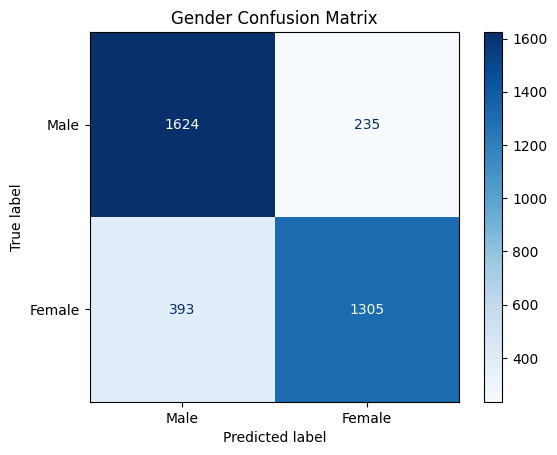

In [81]:
plot_confusion_matrix(all_gender_labels, all_gender_preds,
                      labels=["Male", "Female"],
                      title="Gender Confusion Matrix")

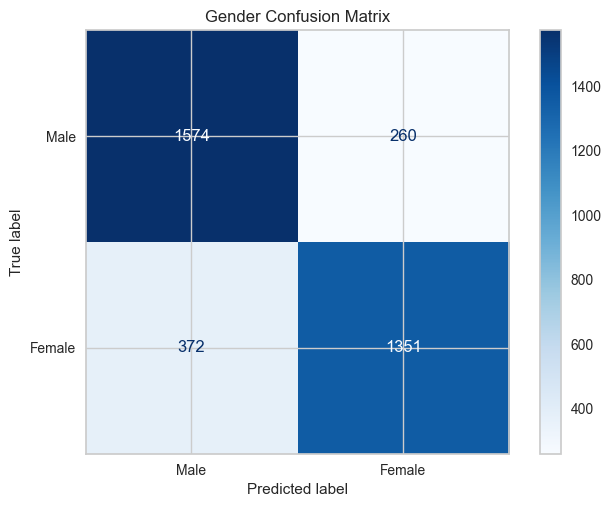

In [115]:
plot_confusion_matrix(all_gender_labels, all_gender_preds,
                      labels=["Male", "Female"],
                      title="Gender Confusion Matrix")

In [82]:
plot_classification_report(all_gender_labels, all_gender_preds,
                           labels=["Male", "Female"])

Classification Report:

              precision    recall  f1-score   support

        Male       0.81      0.87      0.84      1859
      Female       0.85      0.77      0.81      1698

    accuracy                           0.82      3557
   macro avg       0.83      0.82      0.82      3557
weighted avg       0.83      0.82      0.82      3557



In [88]:
plot_classification_report(all_gender_labels, all_gender_preds,
                           labels=["Male", "Female"])

Classification Report:

              precision    recall  f1-score   support

        Male       0.81      0.86      0.83      1834
      Female       0.84      0.78      0.81      1723

    accuracy                           0.82      3557
   macro avg       0.82      0.82      0.82      3557
weighted avg       0.82      0.82      0.82      3557



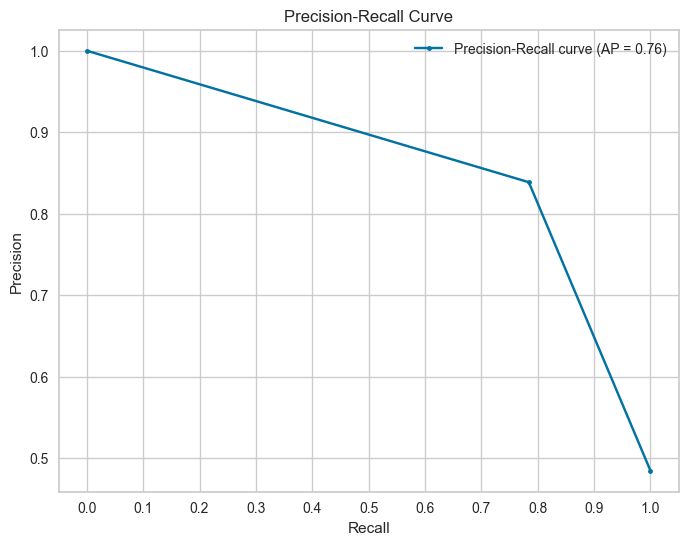

In [113]:
precision, recall, thresholds = precision_recall_curve(all_gender_labels,
                                                       all_gender_preds)

average_precision = average_precision_score(all_gender_labels, all_gender_preds)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.',
         label=f'Precision-Recall curve (AP = {average_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.grid(True)
plt.xticks(np.arange(0.0, 1.1, 0.1))
plt.show()


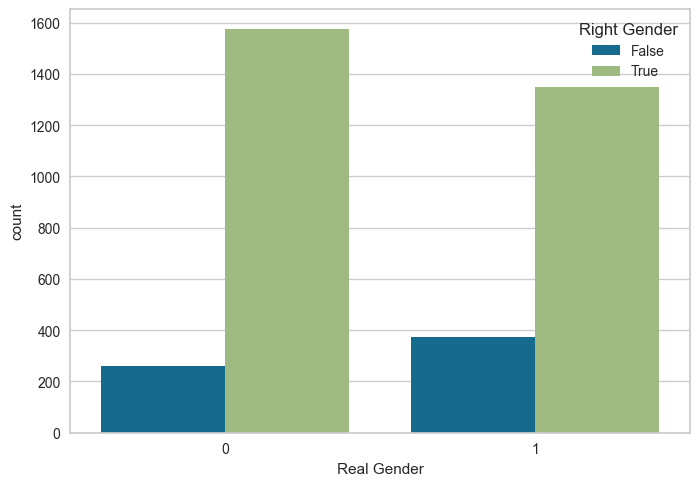

In [125]:
sns.countplot(data=predictions, hue='Right Gender', x='Real Gender')
plt.show()

As we can see, more women than men were misidentified, despite the fact that there are more men in our dataset. Let's take a closer look by plotting distributions by ethnicity and age.

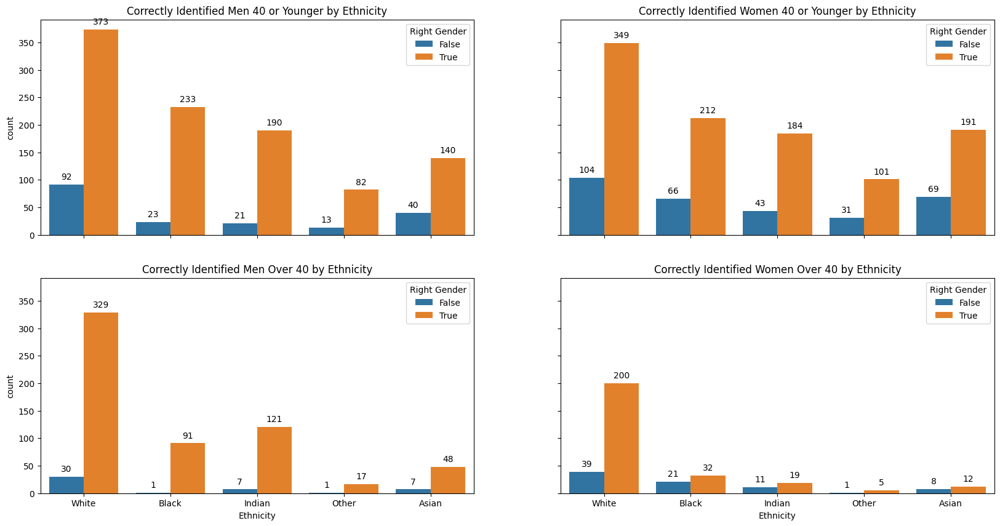

In [83]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10), sharex='all',
                         sharey='all')

ax1 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 0) & (predictions['Real Age'] <= 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[0, 0]
)
add_counts(ax1)
axes[0, 0].set_title('Correctly Identified Men 40 or Younger by Ethnicity')

ax2 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 1) & (predictions['Real Age'] <= 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[0, 1]
)
add_counts(ax2)
axes[0, 1].set_title('Correctly Identified Women 40 or Younger by Ethnicity')

ax3 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 0) & (predictions['Real Age'] > 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[1, 0]
)
add_counts(ax3)
axes[1, 0].set_title('Correctly Identified Men Over 40 by Ethnicity')

ax4 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 1) & (predictions['Real Age'] > 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[1, 1]
)
add_counts(ax4)
axes[1, 1].set_title('Correctly Identified Women Over 40 by Ethnicity')

plt.show()

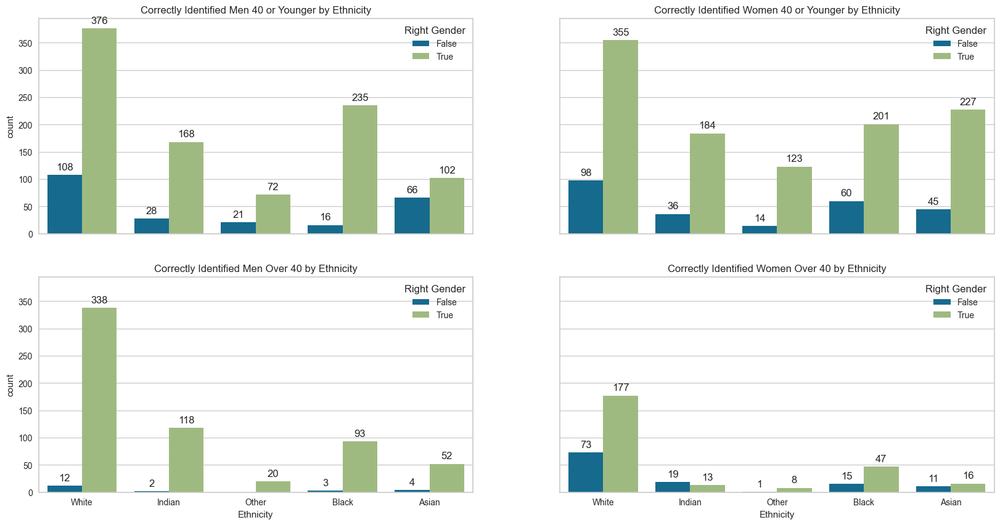

In [123]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10), sharex='all',
                         sharey='all')

ax1 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 0) & (predictions['Real Age'] <= 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[0, 0]
)
add_counts(ax1)
axes[0, 0].set_title('Correctly Identified Men 40 or Younger by Ethnicity')

ax2 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 1) & (predictions['Real Age'] <= 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[0, 1]
)
add_counts(ax2)
axes[0, 1].set_title('Correctly Identified Women 40 or Younger by Ethnicity')

ax3 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 0) & (predictions['Real Age'] > 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[1, 0]
)
add_counts(ax3)
axes[1, 0].set_title('Correctly Identified Men Over 40 by Ethnicity')

ax4 = sns.countplot(
    data=predictions[
        (predictions['Real Gender'] == 1) & (predictions['Real Age'] > 40)],
    hue='Right Gender',
    x='Ethnicity',
    ax=axes[1, 1]
)
add_counts(ax4)
axes[1, 1].set_title('Correctly Identified Women Over 40 by Ethnicity')

plt.show()

The first thing we notice is that our model is more likely to misclassify women. Upon a closer look, we see that Black women, as well as women over 40, are disproportionately affected by this. This could be due to a lack of representation of these populations in our dataset, since most samples over 40 appear to be men. Similarly, our model excels at classifying men over 40, probably for the same reason.

##### Feature Explanation for Gender

To explain our features, we are going to use LIME explainer. This tool will help us identify the areas in the image that were primarily used to determine which class an image belonged to. We are going to compare 10 correctly and incorrectly identified images.

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

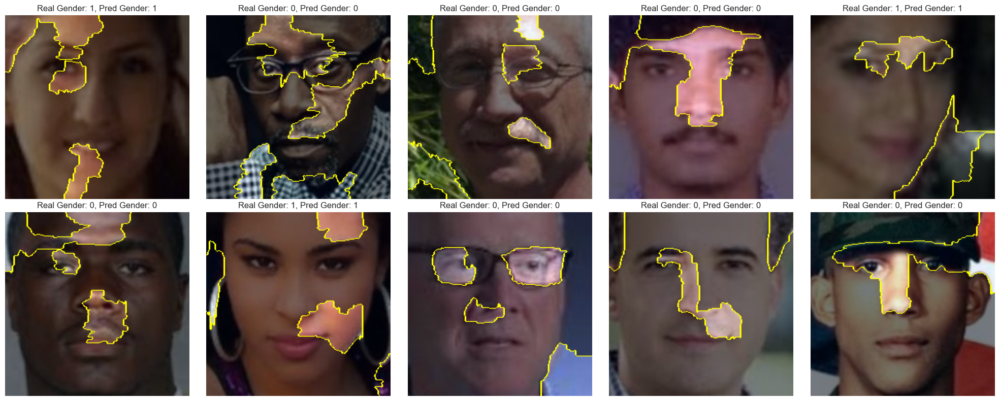

In [105]:
explain_gender_with_lime_samples(model, best_gender_samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

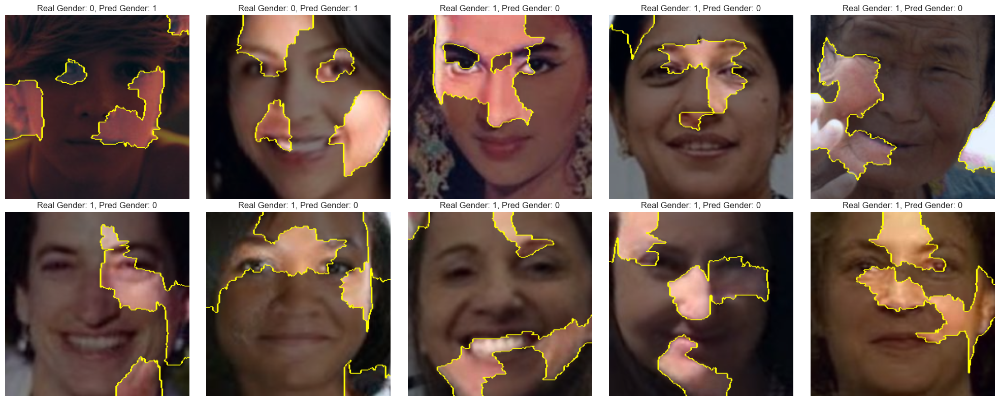

In [106]:
explain_gender_with_lime_samples(model, worst_gender_samples)

In both cases we see how the model primarily uses parts of the face to identify gender. However, it seems it sometimes uses other elements, such as hair or clothes. There is no remarkable difference between correct and incorrect predictions in terms of image explanation.

We see how we got a false negative in the second image. Although the person was correctly identified as a woman, she was mislabeled as a man. This means other images could have similar issues, and should be investigated if this dataset were to be used to train models for production.

#### Age Prediction

First of all, we are going to plot our residuals.

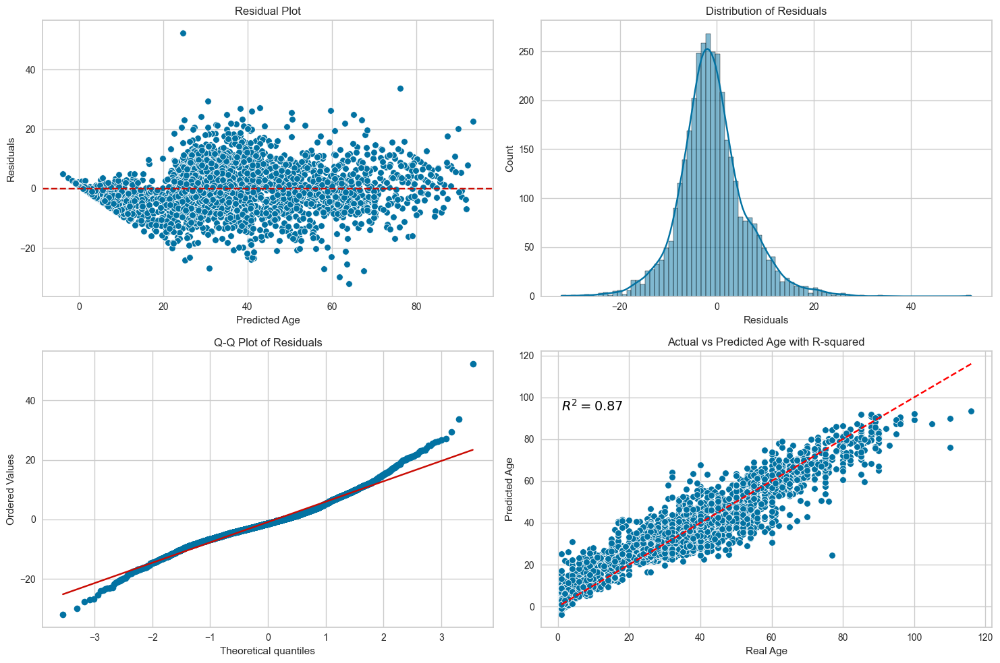

In [194]:
predictions['Residuals'] = predictions['Real Age'] - predictions[
    'Predicted Age']

fig, axs = plt.subplots(2, 2, figsize=(15, 10))

sns.scatterplot(x=predictions['Predicted Age'], y=predictions['Residuals'],
                ax=axs[0, 0])
axs[0, 0].axhline(y=0, color='r', linestyle='--')
axs[0, 0].set_xlabel('Predicted Age')
axs[0, 0].set_ylabel('Residuals')
axs[0, 0].set_title('Residual Plot')

sns.histplot(predictions['Residuals'], kde=True, ax=axs[0, 1])
axs[0, 1].set_xlabel('Residuals')
axs[0, 1].set_title('Distribution of Residuals')

stats.probplot(predictions['Residuals'], dist="norm", plot=axs[1, 0])
axs[1, 0].set_title('Q-Q Plot of Residuals')

r2 = r2_score(predictions['Real Age'], predictions['Predicted Age'])
sns.scatterplot(x=predictions['Real Age'], y=predictions['Predicted Age'],
                ax=axs[1, 1])
axs[1, 1].plot([min(predictions['Real Age']), max(predictions['Real Age'])],
               [min(predictions['Real Age']), max(predictions['Real Age'])],
               color='red', linestyle='--')

axs[1, 1].text(x=min(predictions['Real Age']),
               y=max(predictions['Predicted Age']),
               s=f'$R^2 = {r2:.2f}$', fontsize=14, color='black')

axs[1, 1].set_xlabel('Real Age')
axs[1, 1].set_ylabel('Predicted Age')
axs[1, 1].set_title('Actual vs Predicted Age with R-squared')

plt.tight_layout()
plt.show()


As we can see, our distribution of residuals follows a normal distribution. We see however that the peak is slightly lower than 0. This means our model often thinks people are older than they actually are.

Let's plot the residuals across ethnicities.

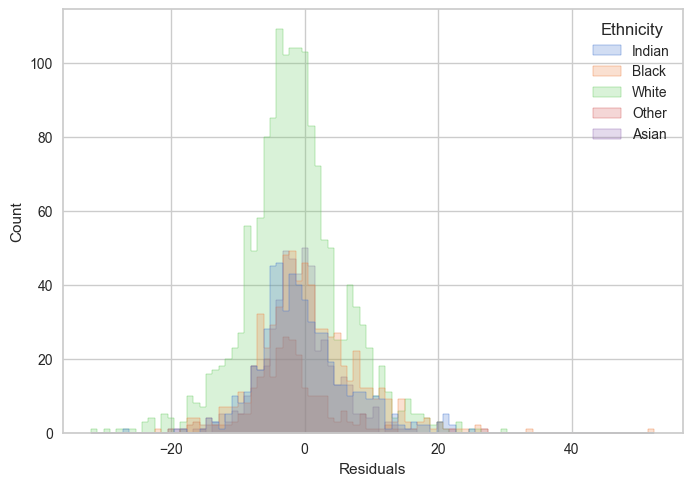

In [198]:
sns.histplot(data=predictions, hue='Ethnicity',
             x='Residuals', palette='muted', multiple='layer', element='step')
plt.show()

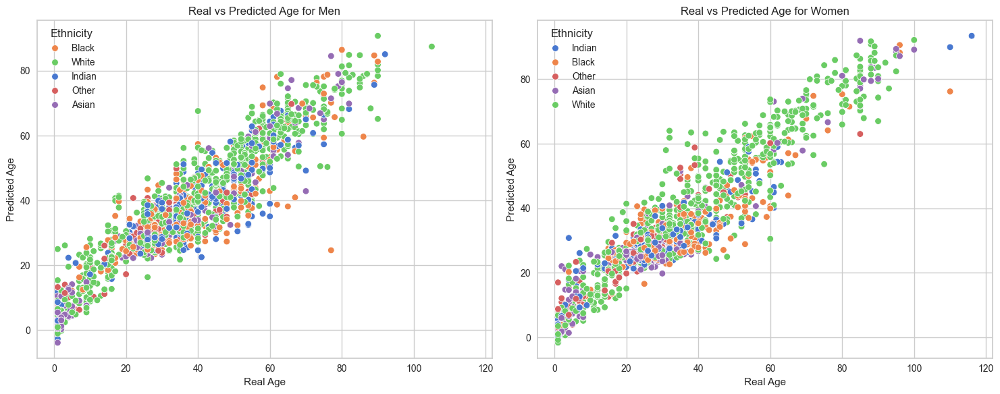

In [210]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6), sharex='all')

unique_ethnicities = predictions['Ethnicity'].unique()
color_palette = sns.color_palette('muted', len(unique_ethnicities))
color_mapping = dict(zip(unique_ethnicities, color_palette))

sns.scatterplot(data=predictions[predictions['Real Gender'] == 0],
                x='Real Age', y='Predicted Age', hue='Ethnicity', ax=axs[0],
                palette=color_mapping)
axs[0].set_title('Real vs Predicted Age for Men')
axs[0].set_xlabel('Real Age')
axs[0].set_ylabel('Predicted Age')

sns.scatterplot(data=predictions[predictions['Real Gender'] == 1],
                x='Real Age', y='Predicted Age', hue='Ethnicity', ax=axs[1],
                palette=color_mapping)
axs[1].set_title('Real vs Predicted Age for Women')
axs[1].set_xlabel('Real Age')
axs[1].set_ylabel('Predicted Age')

plt.tight_layout()
plt.show()

It seems all ethnicities follow a similar distribution. Now, let's check LIME for feature explanation.

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

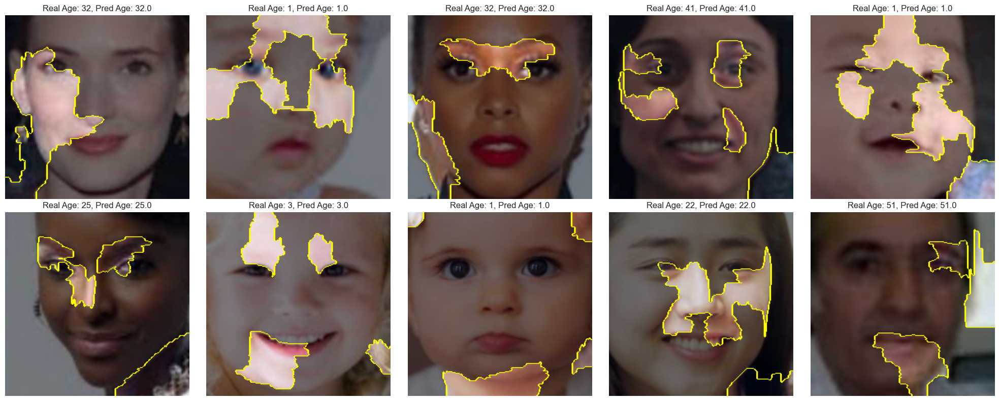

In [108]:
explain_age_with_lime_samples(model, best_age_samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

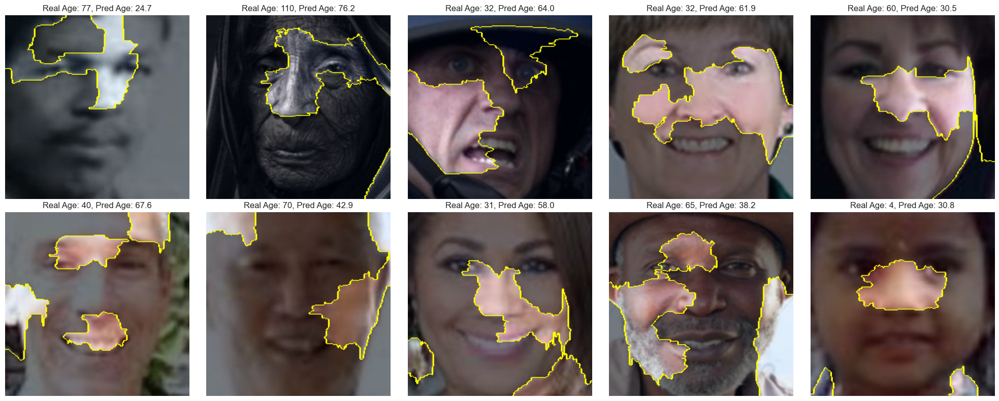

In [110]:
explain_age_with_lime_samples(model, worst_age_samples)

Just like with gender, we don't see any discernible patterns between correct and incorrect predictions.

## Ethical Analysis

Before we deploy a model, we need to consider whether that is a good idea. Just like us, our models can contain biases that may raise ethical concerns.

As an initial concern, we should wonder whether it is a good idea to release a project that assumes that gender is an absolute, and more so, a binary. Gender is a social construct. It is organised differently in different cultures. Furthermore, gender does not always correspond to sex. What we may be predicting here is gender expression, which is also considerably more complex than "male" and "female".

As we mentioned before, Black women and women over 40 are significantly more likely to be classified as men. This can be seen as a reflection of biases present in contemporary society: Are Black women perceived as more masculine? Are women over 40 invisibilised? Therefore, we need to be very careful in order not to perpetuate certain stereotypes.

A possible solution to mitigate this issue would be to have a more representative dataset. We would need more older women, for example.

Given our model performance, it could be deployed in contexts where gender classification is less critical, and the impact of misclassification is less severe. One example could be an app that identifies gender and age, for merely entertainment purposes.

On the other hand, contexts such as healthcare or HR would not be appropriate for our model, since these biases could have serious consequences as it may be a source of discrimination.

## Conclusions

For this project, we have tried to predict age and gender from a set of images. In order to do that, we used a pre-trained LeViT model (facebook/levit-128s), adding custom output layers (age_head and gender_head) to get both age and gender from a single pass, as well as a 0.5 dropout rate. Although the results we achieved appear to be acceptable (82% accuracy, 87% R2), we found some biases in our model, as it tends to misclassify Black women and women over 40 as men. This is likely to be due to a lack of representation of those populations in our dataset. Therefore, this model would not be suitable for production in contexts were such misrepresentation can have serious consequences for the people exposed.

Besides a more balanced dataset, it would be interesting to perform data augmentation in underrepresented populations, as well as modify weights to penalise misclassification in said groups more harshly.